# <a href="https://mipt-stats.gitlab.io/courses/ad_mipt.html">Phystech@DataScience</a>
## Задание 5

**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_pds_bot`.
* Дедлайн **20 апреля в 22:00**. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате `ipynb` и все фотографии, если пишете теоретическую часть от руки.
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Публикация решения может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него.

-----

*Замечания.* Теоретические решения можно оформить
* в $\LaTeX$-формате в ноутбуке;
* написать от руки и прикрепить к ноутбуку;
* написать от руки и выслать боту.  

Во втором случае также **важно** "вшить" фото в ноутбук. Сделать это можно с помощью Edit -> Insert Image в Jupyter или с помощью кнопки "Вставить изображение" в Colab. Следите за размером итогового файла.

Фотографии принимаются только в хорошем качестве, **следите за освещением и почерком**. На фотографиях также указывайте номера задач.

-----

In [2]:
import numpy as np
import pandas as pd
import scipy.stats as sps

import matplotlib.pyplot as plt
import seaborn as sns

red = '#FF3300'
blue = '#0099CC'
green = '#00CC66'

from statsmodels.sandbox.stats.multicomp import multipletests
from tqdm.notebook import tqdm
from statsmodels.stats.diagnostic import lilliefors

%matplotlib inline


# Теоретическая часть

## p-value

### Задача 1. 
 Для всех пунктов задач 5 и 6 прошлого домашнего задания выпишите формулу для p-value  $p(t) = <...>$  в виде кода на `scipy`, где $t$ - реализация статистики вашего критерия, т.е. $t = T(x), x$ &mdash; реализация выборки, $T(X)$ &mdash; статистика. 

Для задачи 6 также посчитайте численные значения для обоих случаев p-value для данного в задаче существа. Какие гипотезы отклоняются? 

Вычисления можно выполнить в Питоне по приведенным вами формулам. 

## Множественная проверка гипотез


### Задача 2.
 Пусть $X_1, ...,  X_n$ --- выборка из неизвестного распределения $\mathsf{P}$. Для проверки гипотез $\mathsf{H}_0\ vs.\ \mathsf{H}_1$ было решено использовать три различных критерия. Соответствующие p-value равны 0.00001, 0.7361, 0.0482. Какое должно быть принято решение об отвержении гипотезы $\mathsf{H}_0$ на уровне значимости 0.05? *Подсказка: используйте любой подходящий метод МПГ, далее делайте вывод об отвержении/не отвержении, поясните свой вывод.*

## Хи-квадрат

### Задача 3.
 Компания по производству кормов для собак провела опрос $5000$ владельцев собак о том, какой корм предпочитают их питомцы. По результатам опроса оказалось, что $1010$ собак предпочитают корм со вкусом лосося, $2200$ &mdash; со вкусом курицы, $950$ &mdash; со вкусом говядины, а все остальные собаки предпочитают корм с овощами. Компания сделала предположение, что вероятности предпочтения кормов равны соответственно $\theta, 2\theta, \theta, 1-4\theta$,
	где $\theta\in(0,1/4)$. Верно ли данное предположение? Выпишите теоретические формулы и код для подсчета значения статистики и p-value  в `scipy`. Вычисление статистики и p-value можно выполнить в Питоне.


### Задача 1. Решение


* Для задачи №5 статистика критерия имеет вид: $T(X)=\sum_{i=1}^{n}X_i$

p_value = sps.norm(a=$n\theta_0,scale=\sqrt{n}$).sf(t) , где $t=T(x_1,...,x_n)$

* Для задачи №6 статистика критерия имеет вид: $T(X)=\Lambda(X)=\frac{6*49}{44^3*2}Xe^{(6/7-5/44)X}$
 Однако в силу монотонности можно воспользоваться $T(X)=X$
для пункта а) $H_0: P\in{Gamma(6/7,2)}$ $t=T(x)=6.66$ 
$\\ $ p_value = sps.gamma(a=2,scale=7/6).sf(t)
    $\\ $для пункта б) $H_0: P\in{Gamma(5/44,3)}$ ,$T(X)=X, t=6.66$

p_value=sps.gamma(a=3,scale=44/5).sf(t)

In [2]:
#пункт а
t=6*49/44**3/2*6.66*np.exp(6/7*6.66-5/44*6.66)
p_value=sps.gamma(a=2,scale=7/6).sf(6.66)
print('p_value =',p_value,'< 0.05','=> Гипотеза отвергается')

p_value = 0.022255070646549243 < 0.05 => Гипотеза отвергается


In [3]:
#пункт б
t=6*49/44**3/2*6.66*np.exp(6/7*6.66-5/44*6.66)
p_value=sps.gamma(a=3,scale=44/5).sf(6.66)
print('p_value =',p_value,'> 0.05','=> Гипотеза не отвергается')

p_value = 0.9585836025296641 > 0.05 => Гипотеза не отвергается


### Задача 2. Решение

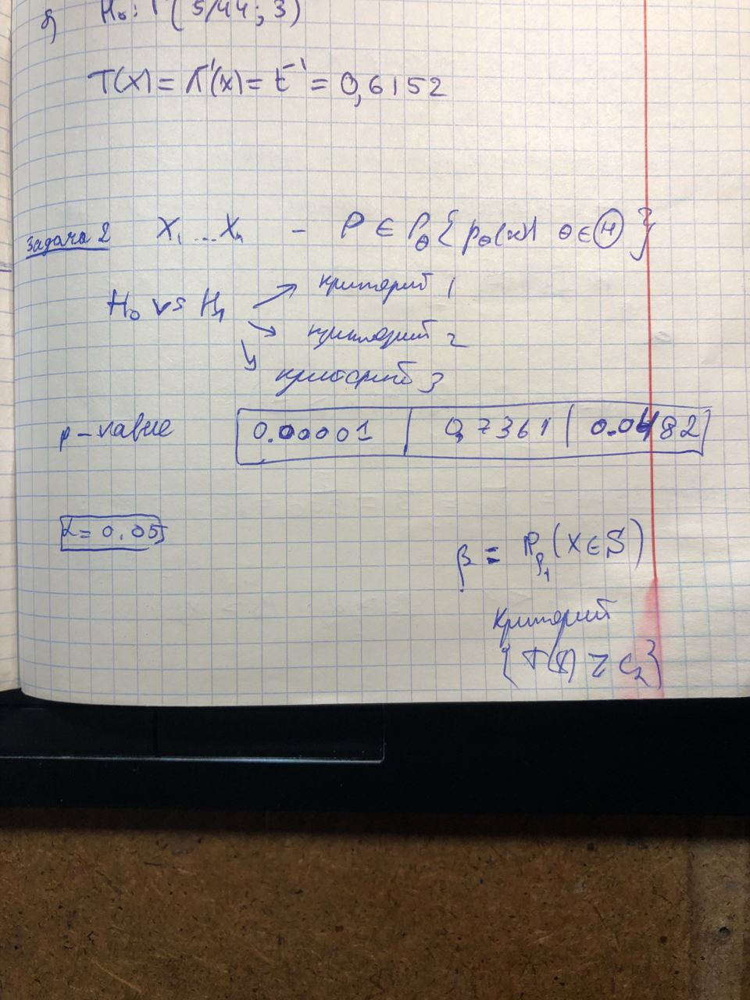

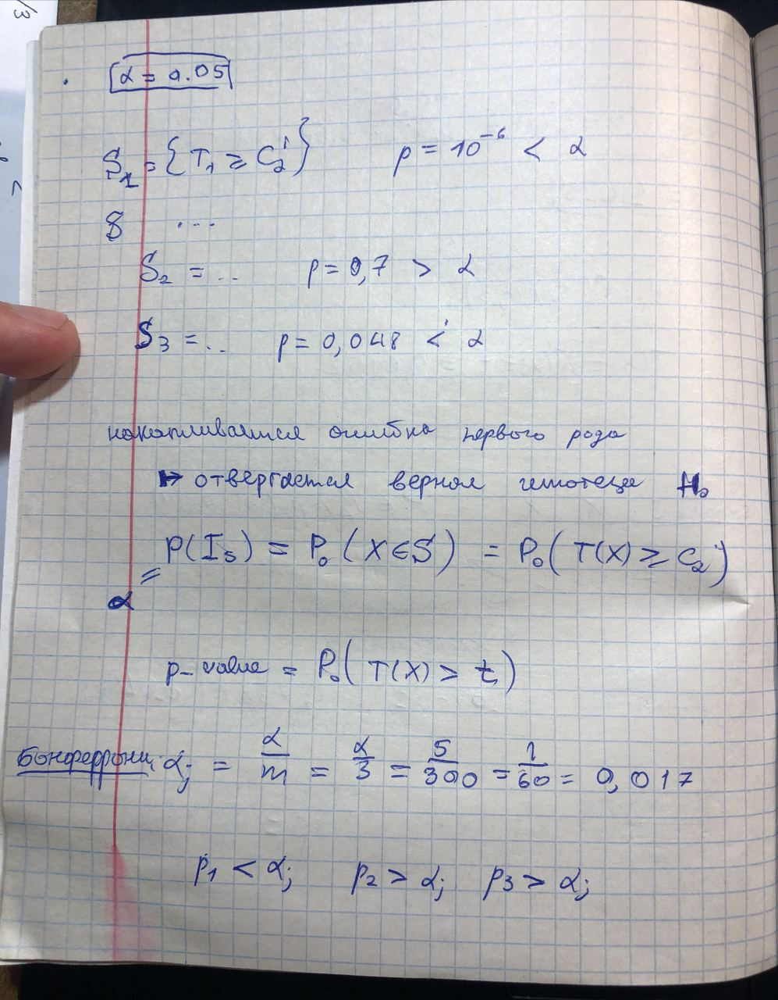

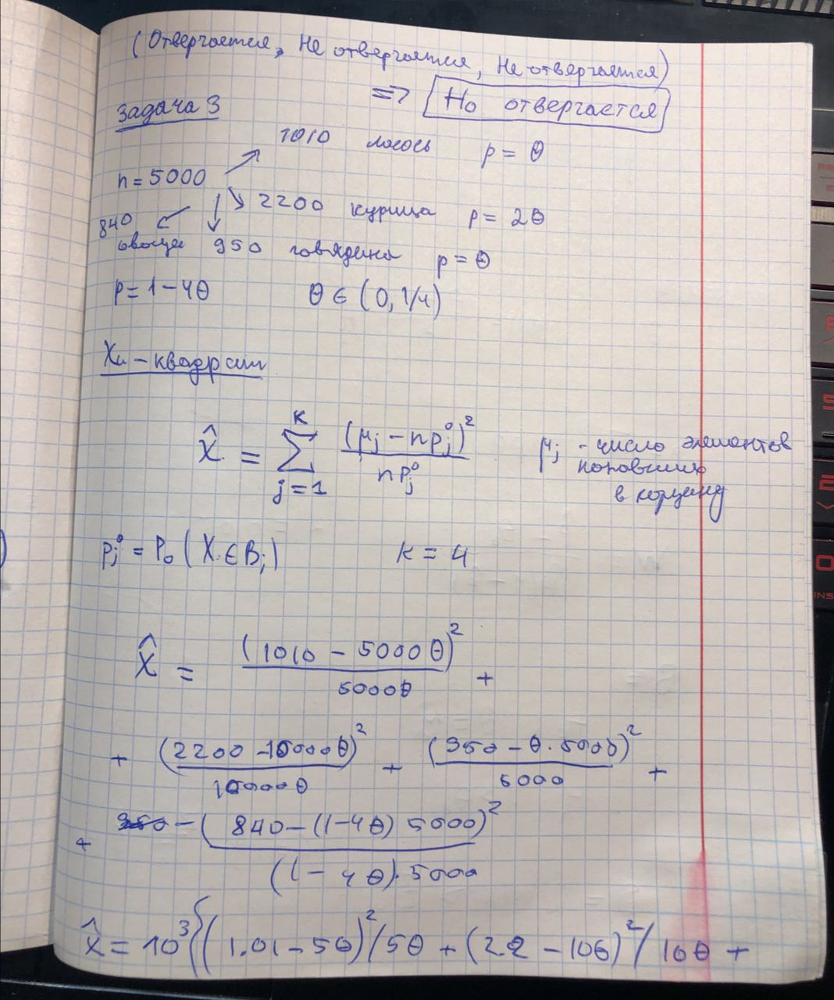

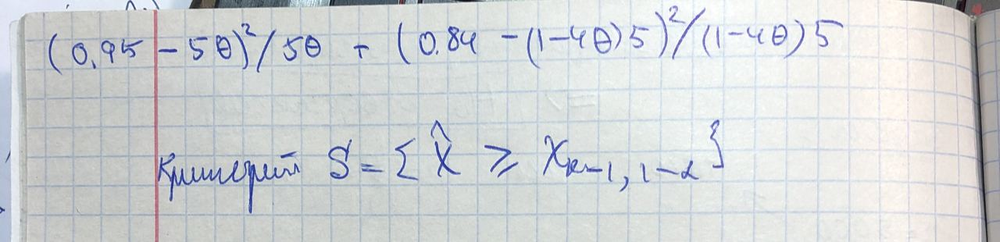

### Задача 3. Решение

In [13]:
t=1/8
sps.chisquare([1010,2200,950,840],f_exp=[5000*t,2*5000*t,5000*t,5000*(1-4*t)])

Power_divergenceResult(statistic=2230.3999999999996, pvalue=0.0)

В ходе реализации критерия при различных значениях $\theta$ можно сказать, что гипотеза отклоняется.

# Практическая часть

## Множественная проверка гипотез


### Задача 4.
Проведены эксперименты для оценки эффективности нескольких препаратов для снижения послеоперационной тошноты. Результаты экспериментов приведены в таблице ниже. При проведении эксперимента пациенты делились на группы случайным образом.

    
                            Количество пациентов  Количество случаев возникновения тошноты

		Плацебо                80                    45 

		Хлорпромазин           75                    26 
    
		Дименгидринат          85                    52 
    
		Пентобарбитал (100 мг) 67                    35 
    
		Пентобарбитал (150 мг) 85                    37 
    

 Проведите сравнение каждого препарата по эффективности по отношению к плацебо c использованием критерия Вальда (см. лекцию 5 и последующие). Какие методы МПГ, контролирующие FWER и FDR, можно использовать в данной задаче? Какие ответы можно получить для этих методов? В каждом случае приведите значения статистики критерия Вальда, p-value и скорректированные p-value. Оформите решение структурированно. 

In [12]:
data = pd.DataFrame([["Плацебо", 80, 45],
    ["Хлорпромазин", 75, 26],
    ["Дименгидринат", 85, 52],
    ["Пентобарбитал (100 мг)", 67, 35],
    ["Пентобарбитал (150 мг)", 85, 37]])

data.columns = ["Название", "Количество пациентов", "Количество случаев возникновения тошноты"]

In [13]:
data

,Название,Количество пациентов,Количество случаев возникновения тошноты
0,Плацебо,80,45
1,Хлорпромазин,75,26
2,Дименгидринат,85,52
3,Пентобарбитал (100 мг),67,35
4,Пентобарбитал (150 мг),85,37


In [14]:
data["Ef"]=1-data["Количество случаев возникновения тошноты"]/data["Количество пациентов"]
data

,Название,Количество пациентов,Количество случаев возникновения тошноты,Ef
0,Плацебо,80,45,0.437500
1,Хлорпромазин,75,26,0.653333
2,Дименгидринат,85,52,0.388235
3,Пентобарбитал (100 мг),67,35,0.477612
4,Пентобарбитал (150 мг),85,37,0.564706


### Запишем односторонний критерий  Вальде.
Будем считать что случайные величины распределены по Бернулли с оценками параметра p из таблицы "Эффективность препарата". 
    $S=\left(\widehat{\theta}-\frac{Z_{1-\alpha}\widehat{\sigma}}{\sqrt{n}},+\infty \right)$
 где $\widehat\sigma=\sqrt{\widehat\theta(1-\widehat\theta)}$

FDR - Бенджамини-Хохберг потому что выборки независимы.

In [15]:
theta=data['Ef']
number=data['Количество пациентов']
W=(theta-theta[0])*np.sqrt(number)/np.sqrt(theta*(1-theta))
p_v=sps.norm.sf(W) #p_values

In [16]:
M=multipletests(p_v,method='bonferroni')
bonf=pd.DataFrame(np.array([M[0],M[1]]).T)
bonf.columns=['result','corr_p_v']
bonf['p_value']=p_v
bonf #Bonferroni FWER

,result,corr_p_v,p_value
0,0.0,1.000000,0.500000
1,1.0,0.000215,0.000043
2,0.0,1.000000,0.824326
3,0.0,1.000000,0.255488
4,1.0,0.045020,0.009004


In [19]:
N=multipletests(p_v,method='fdr_bh')
Bh=pd.DataFrame(np.array([N[0],N[1]]).T)
Bh.columns=['result','corr_p_v']
Bh['p_value']=p_v
Bh #Benjamini_Hohgberg FDR

,result,corr_p_v,p_value
0,0.0,0.625000,0.500000
1,1.0,0.000215,0.000043
2,0.0,0.824326,0.824326
3,0.0,0.425813,0.255488
4,1.0,0.022510,0.009004


**Вывод:** По таблице скорректированных p-value видно, что метод контроля ошибки FDR отвергает немного больше (значения p-value в общем меньше). 

## Критерии согласия

При решении стоит использовать **готовые реализации критериев из** `scipy.stats`. При возникновении затруднений посмотрите в ноутбук с лекции 9.
________________
### Задача 5.

С помощью критерия хи-квадрат вам нужно проверить, правильно ли `scipy.stats` генерирует случайные величины. 

**1.** Реализуйте критерий хи-квадрат для проверки корректности генерации выборки $U\{1, ..., 10\}$ (дискретное равномерное распределение). Тем самым проверьте, что `sps.randint` действительно генерирует выборку из равномерного распределения. Подберите размер выборки такой, чтобы выполнялись условия применимости критерия хи-квадрат. Поясните свой выбор.





1) $n>50$
2) $np_j>5$
3) $k>log_2{n}$
n - число элементов выборки
k - число корзин
$np_j$- ожидаемое число элементов в корзине

In [194]:
p_j=1/10 #вероятность
n=1000
k = 10 # #корзин
sample=sps.randint(1,11).rvs(size=n)
a=np.zeros(k)
for i in range(k):
    a[i]=sample[sample==i+1].size

sps.chisquare(a,f_exp=[100]*10)

Power_divergenceResult(statistic=7.0200000000000005, pvalue=0.6350370215752201)

**2.** Проверьте, действительно ли код `sps.poisson(mu=5).rvs(size=1000)` генерирует выборку размера 1000 из пуассоновского распределения с параметром 5. 

**Указания**
1. Не забудьте учесть условия применимости критерия хи-квадрат;
2. Для вычисления дискретной плотности (вероятности) воспользуйтесь `sps.poisson(mu=5).pmf`;
3. Для подсчета количества элементов в разбиении на множества воспользуйтесь `np.unique(sample, return_counts=True)`;
4. Не нужно писать сколь-либо универсальный код, который одним нажатием кнопки проверяет гипотезу с учетом всех условий применимости критерия. Расписывайте код поэтапно, на каждый логический этап свой код в отдельной ячейке для *конкретной* реализации выборки. Так вам проще реализовать, а нам проще проверять.




In [193]:
n=1000
k=10
smp=sps.poisson(mu=5).rvs(size=n)
a=np.zeros(k)
for i in range(k):
    a[i]=smp[smp==i+1].size
sps.chisquare(a,f_exp=np.array([n*sps.poisson(mu=5).pmf(i+1) for i in range(k)]))

Power_divergenceResult(statistic=3.5918216223142916, pvalue=0.93617022393412)

**Вывод:** В ходе данной задачи было проверено, что гипотеза о том, распределение элементов выборки соответствует заданному, верна с различными значениями p-value, однако поскольку значения в обоих случаях больше $\alpha$, то об относительном значении мы ничего сказать не можем (в каком случае гипотеза верна в большей вероятностью). 

__________________
### Задача 6.

На лекциях и семинарах были разобраны следующие критерии проверки нормальности:
* Колмогорова;
* Жарка-Бера;
* Шапиро-Уилка.

При этом критерий Колмогорова универсален, но существует его модификация для проверки нормальности — <a href="https://ru.wikipedia.org/wiki/Критерий_Лиллиефорса"> Критерий Лиллиефорса.</a> При решении задачи можете воспользоваться им, например, взяв реализацию из библиотеки `statsmodels`: <a href="https://www.statsmodels.org/stable/generated/statsmodels.stats.diagnostic.lilliefors.html">`statsmodels.stats.diagnostic.lilliefors`</a>, или же применять для конкретной $F_0$ критерий Колмогорова, пример использования которого можно найти в ноутбуке с лекции.

**1.** Данные критерии являются асимптотическими, и их реальное значение уровня значимости может отличаться от желаемого числа $\alpha=0.05$. На лекции 7 разобран метод оценки реального уровня значимости критерия. Посчитайте реальный уровень значимости этих критериев для размеров выборки от 5 до 100. В данном случае можно привести теоретические соображения, согласно которым стоит использовать количество генерируемых выборок `sample_count `$\ge 10^6$, но для ускорения работы при выполнении задания можете использовать `sample_count = 10**4`.



*Подсказка:*

In [12]:
#Колмогоров
max_sample_size = 100
sample_count = 10**4
is_reject_sk = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.norm.rvs(size=i+1)
        if(sps.kstest(sample,'norm')[1]<0.05):
            is_reject_sk[i, j] = 1
        else:
            is_reject_sk[i, j] = 0


  0%|          | 0/100 [00:00<?, ?it/s]

In [15]:
#Критерий Жарка-Бера
max_sample_size = 100
sample_count = 10**4
is_reject_jb = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.norm.rvs(size=i+1)
        if(sps.jarque_bera(sample)[1]<0.05):
            is_reject_jb[i, j] = 1
        else:
            is_reject_jb[i, j] = 0

  0%|          | 0/100 [00:00<?, ?it/s]

In [18]:
#Критерий Шапиро-Уилка
max_sample_size = 100
sample_count = 10**4
is_reject_sh = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.norm.rvs(size=i+3)
        if(sps.shapiro(sample)[1]<0.5):
            is_reject_sh[i, j] = 1
        else:
            is_reject_sh[i, j] = 0

  0%|          | 0/100 [00:00<?, ?it/s]

Нарисуйте на одном графике зависимость реального уровня значимости от размера выборки для каждого критерия. Пунктиром отметьте уровень 0.05. Не забудьте добавить легенду и подписать оси.

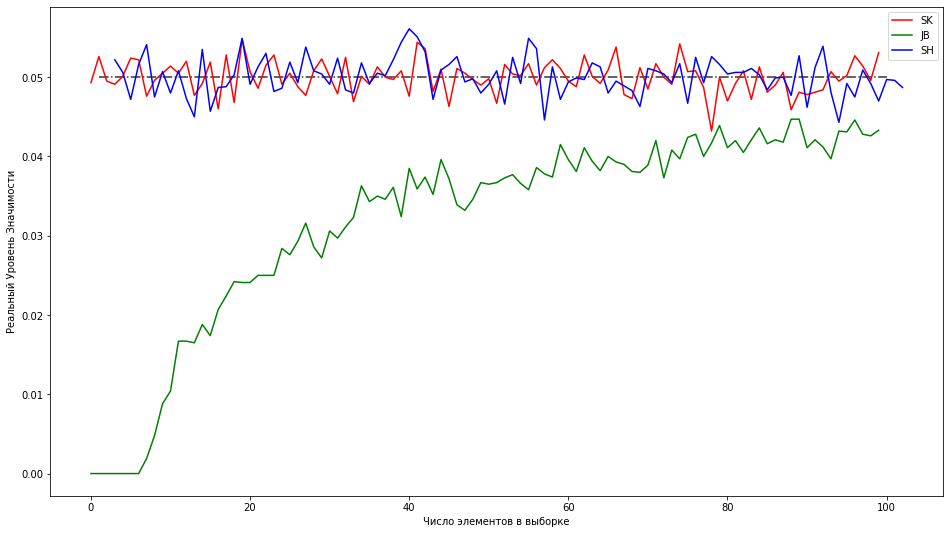

In [184]:
plt.figure(figsize=(16,9))
grid=np.arange(3,103)
alpha_sk=is_reject_sk.mean(axis=1)
alpha_jb=is_reject_jb.mean(axis=1)
alpha_sh=is_reject_sh.mean(axis=1)
plt.plot(alpha_sk,color='red',label="SK")
plt.plot(alpha_jb,color='green',label='JB')
plt.plot(grid,alpha_sh,color='blue',label='SH')
plt.legend()
plt.xlabel('Число элементов в выборке')
plt.ylabel('Реальный Уровень Значимости')
plt.hlines(0.05,1,100,linestyles='dashdot',color='black',alpha=0.8)

Какой можно сделать вывод?

Так как критерии асимптотические, реальный уровень значимости может отличаться при конечном размере выборки. Однако при применении критерия Колмогорова и критерия Шапиро-Уилка были получены значения колеблющиеся вблизи уровня значимости 0.05.
Критерий Жарка-Бера стремится к 0.05 сверху из нуля.

**2.** Аналогичным образом можно вычислять мощность критерия. Вычислите мощности критериев для размеров выборки от 5 до 100, если альтернативная гипотеза заключается в том, что выборка имеет стандартное распределение Коши. Иначе говоря, для критерия $S$ надо приближенно посчитать $\beta_S(\mathsf{P})$, где $\mathsf{P}$ — стандартное распределение Коши.

Нарисуйте на одном графике зависимость мощности критерия от размера выборки для каждого критерия. Не забудьте добавить легенду и подписать оси.


In [185]:
#Колмогоров
max_sample_size = 100
sample_count = 10**4
is_reject_sk = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.cauchy.rvs(size=i+1)
        if(sps.kstest(sample,'norm')[1]<0.05):
            is_reject_sk[i, j] = 1
        else:
            is_reject_sk[i, j] = 0

            #Критерий Жарка-Бера
max_sample_size = 100
sample_count = 10**4
is_reject_jb = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.cauchy.rvs(size=i+1)
        if(sps.jarque_bera(sample)[1]<0.05):
            is_reject_jb[i, j] = 1
        else:
            is_reject_jb[i, j] = 0
#Критерий Шапиро-Уилка
max_sample_size = 100
sample_count = 10**4
is_reject_sh = np.zeros((max_sample_size, sample_count))

# tqdm показывает, сколько еще времени будет выполняться цикл и сколько прошло
for i in tqdm(range(max_sample_size)):
    for j in range(sample_count):
        sample = sps.cauchy.rvs(size=i+3)
        if(sps.shapiro(sample)[1]<0.5):
            is_reject_sh[i, j] = 1
        else:
            is_reject_sh[i, j] = 0

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\scipy\stats\stats.py:1762: RuntimeWarning: invalid value encountered in double_scalars
  skewness = (1 / n * np.sum(diffx**3)) / (1 / n * np.sum(diffx**2))**(3 / 2.)
c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\scipy\stats\stats.py:1763: RuntimeWarning: invalid value encountered in double_scalars
  kurtosis = (1 / n * np.sum(diffx**4)) / (1 / n * np.sum(diffx**2))**2


  0%|          | 0/100 [00:00<?, ?it/s]

Text(0, 0.5, 'Реальная Мощность критерия')

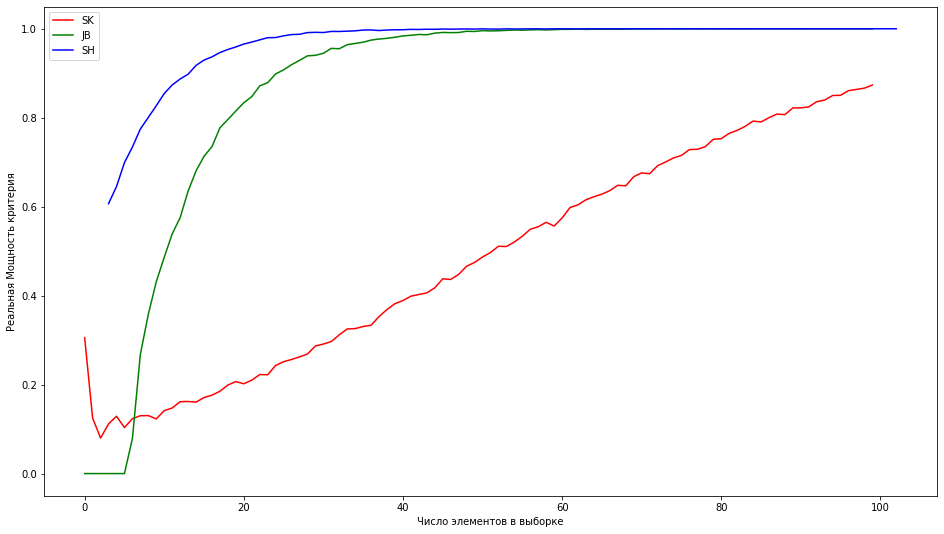

In [186]:
plt.figure(figsize=(16,9))
grid=np.arange(3,103)
beta_sk=is_reject_sk.mean(axis=1)
beta_jb=is_reject_jb.mean(axis=1)
beta_sh=is_reject_sh.mean(axis=1)
plt.plot(beta_sk,color='red',label="SK")
plt.plot(beta_jb,color='green',label='JB')
plt.plot(grid,beta_sh,color='blue',label='SH')
plt.legend()
plt.xlabel('Число элементов в выборке')
plt.ylabel('Реальная Мощность критерия')
#plt.hlines(0.05,1,100,linestyles='dashdot',color='black',alpha=0.8)

Сделайте вывод. Какой критерий является наиболее мощным при данной альтернативе?

На графике явно видно, что критерий Колмогорова имеет гораздо меньшую мощность, нежели критерии Жарка-Бера и Шапиро-Уилка. Среди двух более мощных критериев стоит выделить критерий Шапиро-Уилка, который выходит на значение мощности равной единице уже при размере выборки равном 30.

**3*.** Распределение [Стьюдента](https://ru.wikipedia.org/wiki/%D0%A0%D0%B0%D1%81%D0%BF%D1%80%D0%B5%D0%B4%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5_%D0%A1%D1%82%D1%8C%D1%8E%D0%B4%D0%B5%D0%BD%D1%82%D0%B0) является в некотором смысле обобщением нормального распределения (при бесконечном количестве степеней свободы) и распределения Коши (при одной степени свободы). 

Постройте на одном графике графики плотности распределения Коши, распределения Стьюдента с 1, 5, 10 степенями свободы и стандартного нормального распределения. Как меняется форма графика распределения Стьюдента с изменением количества степеней свободы? 

In [ ]:
<...>

Посчитайте приближенно мощности критериев для выборки размера 50 если альтернатива заключается в том, что выборка имеет распределение Стьюдента. Поскольку мощность критерия является функцией от распределения из альтернативной гипотезы, вам нужно реализовать функцию (например, принимающую количество степенй свободы). Посчитайте её значения для целых значений степени свободы от 1 до 10.

Нарисуйте на одном графике зависимость мощности критерия от **количества степеней свободы** для каждого из трех критериев. Не забудьте добавить легенду и подписать оси.

In [ ]:
<...>

Сделайте вывод относительно мощности критерия при разных распределениях из альтернативы. Объясните наблюдаемую зависимость мощности от степени свободы.

<...>

__________________
### Задача 7.


Cкачайте данные <a href="http://archive.ics.uci.edu/ml/datasets/wine">`wine dataset`</a>. Для этого зайдите в папку "DataFolder" и скачайте файл `wine.data`. Читать файл можно с помощью функции `read_csv`.  В этом датасете представлены различные характеристики вин. Возьмите все колонки, кроме `Class` (класс вина). В дальнейшем, как и раньше, будем называть колонки признаками.

In [15]:
data=pd.read_csv('.\wine.data')
data.columns=['Class','Alcohol',
'Malic acid',
'Ash',
 'Alcalinity of ash'
, 'Magnesium'
, 'Total phenols'
, 'Flavanoids'
, 'Nonflavanoid phenols'
, 'Proanthocyanins'
,'Color intensity'
,'Hue'
,'OD280/OD315 of diluted wines'
,'Proline']
data

,Class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
0,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
1,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
2,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
3,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
4,1,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
173,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
174,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
175,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


Для каждого из признаков нарисуйте Q-Q plot. Для наглядности и экономии места рисуйте графики в несколько строк и столбцов, используя `plt.subplot`.

No handles with labels found to put in legend.


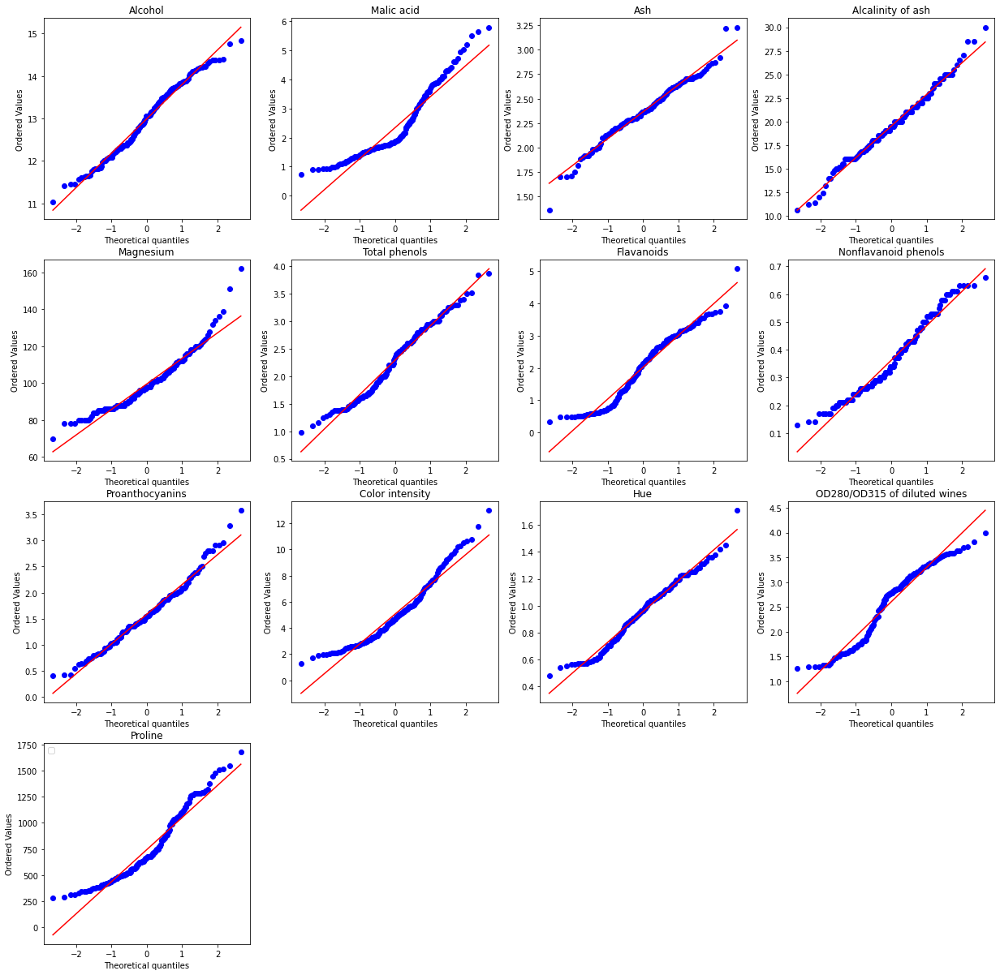

In [17]:
plt.figure(figsize=(21,21))
k=1
for i in data.columns[1:]:
    ax=plt.subplot(4,4,k,label=i)
    k+=1
    sps.probplot(data[i],plot=ax)
    plt.title(i)
plt.legend()

Для каких признаков можно говорить об их нормальности и почему?

**Ответ:** Точки на графике при использовании QQ-plot при верности нулевой гипотезы должны лежать на одной прямой. С некоторым приближением гипотеза о нормальности выполнена для:

Ash,Alcalinity of ash,Total phenols,Proanthocyanins

Проверьте нормальность каждого признака статистическими критериями. Прежде чем выполнить следующую часть задачи, ответьте на вопросы. 

Для каждого признака используйте несколько критериев проверки нормальности. Какие критерии вы будете использовать?

**Ответ:** Воспользуемся критериями проверки нормальности Шапиро-Уилка и Жарка-Бера.

Результаты критериев нужно обработать с помощью *одной* процедуры множественной проверки гипотез для всех признаков и всех критериев сразу. Почему так нужно делать?

**Ответ:** Так нужно делать для того, чтобы контролировать ошибку первого рода в случае большого числа данных.

Какой метод для контроля FWER стоит применить и почему?

**Ответ:** Воспользуемся методом Бонферрони, потому что в данном случае он может дать достаточно высокую мощность

Как понять из результата процедуры множественной проверки гипотез, нормальность каких признаков следует отклонить?

**Ответ:** <...>

Если нормальность не отклоняется, что можно сказать про выборку? Ответ находится в презентации с лекции.

**Ответ:** <...>

Реализуйте данную схему. Предварительно соберите p-value всех критериев в таблицу. 

Функция `multipletests` принимает только одномерные массивы, поэтому для полученной `numpy`-таблицы нужно воспользоваться методом `ravel`. Результаты соберите обратно в таблицу с помощью метода `reshape`, которому необходимо передать размерности таблицы. Для наглядности сделайте таблицу с помощью `pandas.DataFrame`. В качестве названий строк используйте названия признаков, а названий столбцов — используемые критерии. В таблице должны присутстововать как значения p-value, так и результат проверки (`True` в случае отвержения).

In [98]:
A_jb={'jb'+i:pd.Series(sps.jarque_bera(data[i])[1]) for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']}
A_sh={'sh'+i:pd.Series(sps.shapiro(data[i])[1]) for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']}
p_v=[sps.jarque_bera(data[i])[1] for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']]+[sps.shapiro(data[i])[1] for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']]
np.ravel(p_v).shape
print(sps.jarque_bera(data['Alcalinity of ash'])[1],sps.shapiro(data['Alcalinity of ash'])[1])

0.2515813783896619 0.26372990012168884


In [101]:
multipletests(np.ravel(p_v),method='bonferroni')

(array([False, False, False,  True, False, False,  True, False]),
 array([0.0843258 , 1.        , 0.5075342 , 0.04321233, 0.32904938,
        1.        , 0.03772266, 0.0853758 ]),
 0.006391150954545011,
 0.00625)

In [94]:
p_v=[sps.jarque_bera(data[i])[1] for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']]+[sps.shapiro(data[i])[1] for i in ['Ash','Alcalinity of ash','Total phenols','Proanthocyanins']]

Для каких признаков нормальность не отвергается?

**Ответ:** Нормальность не отвергается для признака Ash,и для Alcalinity of ash.

**Вывод:** <...>